# 1. 데이터 로드 및 전처리

## 1.1 필요한 라이브러리 불러오기

In [3]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import warnings
from tqdm.auto import tqdm
warnings.filterwarnings('ignore')
# 데이터가 저장된 기본 경로
base_path = 'datasets/val_dataset'


## 1.2 Parquet 파일 불러오기 및 전처리

In [4]:
def load_parquet_data():
    acc_files = [
        'ch2024_val__m_acc_part_1.parquet.gzip',
        'ch2024_val__m_acc_part_2.parquet.gzip',
        'ch2024_val__m_acc_part_3.parquet.gzip',
        'ch2024_val__m_acc_part_4.parquet.gzip'
    ]
    
    acc_data = pd.concat([pd.read_parquet(f'{base_path}/{file}') for file in tqdm(acc_files)])
    activity_data = pd.read_parquet(f'{base_path}/ch2024_val__m_activity.parquet.gzip')
    hr_data = pd.read_parquet(f'{base_path}/ch2024_val__w_heart_rate.parquet.gzip')
    
    return acc_data, activity_data, hr_data

# 데이터 불러오기
acc_data, activity_data, hr_data = load_parquet_data()
print('acc load 완료')

acc_data = acc_data.reset_index(drop=True)
print('acc reset_index 완료')

activity_data = activity_data.reset_index(drop=True)
hr_data = hr_data.reset_index(drop=True)

# date 컬럼 추가 
acc_data['date'] = acc_data['timestamp'].dt.date
print('acc date컬럼 추가 완료')

activity_data['date'] = activity_data['timestamp'].dt.date
hr_data['date'] = hr_data['timestamp'].dt.date

# heart_rate가 0인 값을 NaN으로 대체
hr_data['heart_rate'].replace(0, np.nan, inplace=True)

  0%|          | 0/4 [00:00<?, ?it/s]

acc load 완료
acc reset_index 완료
acc date컬럼 추가 완료


In [10]:
display(acc_data[::10000].head(20))
display(hr_data[::1000].head(20))
display(activity_data[::1000].head(20))


,subject_id,timestamp,x,y,z,date
0,1,2023-08-20 00:00:00.025,0.933201,-3.522235,9.164511,2023-08-20
10000,1,2023-08-20 00:03:09.189,0.937986,-3.527021,9.164511,2023-08-20
20000,1,2023-08-20 00:06:18.925,0.928415,-3.493521,9.164511,2023-08-20
30000,1,2023-08-20 00:09:28.228,0.942772,-3.503092,9.159725,2023-08-20
40000,1,2023-08-20 00:12:37.230,0.957129,-3.507878,9.183653,2023-08-20
50000,1,2023-08-20 00:15:46.208,0.937986,-3.531806,9.154940,2023-08-20
60000,1,2023-08-20 00:18:55.152,0.937986,-3.493521,9.169296,2023-08-20
70000,1,2023-08-20 00:22:04.216,0.942772,-3.512664,9.178867,2023-08-20
80000,1,2023-08-20 00:25:13.397,0.942772,-3.507878,9.174082,2023-08-20
90000,1,2023-08-20 00:28:22.399,1.081556,-3.689733,9.269794,2023-08-20


,subject_id,timestamp,heart_rate,date
0,1,2023-08-20 00:00:44.572,NaN,2023-08-20
1000,1,2023-08-20 16:43:20.532,72.0,2023-08-20
2000,1,2023-08-21 09:25:50.134,NaN,2023-08-21
3000,1,2023-08-22 02:08:20.558,NaN,2023-08-22
4000,1,2023-08-22 18:50:40.107,86.0,2023-08-22
5000,1,2023-08-23 12:18:39.374,44.0,2023-08-23
6000,1,2023-08-24 05:01:26.957,NaN,2023-08-24
7000,1,2023-08-24 21:55:01.417,75.0,2023-08-24
8000,1,2023-08-25 14:37:36.976,84.0,2023-08-25
9000,1,2023-08-26 07:20:10.771,NaN,2023-08-26


,subject_id,timestamp,m_activity,date
0,1,2023-08-20 00:00:12.814,3,2023-08-20
1000,1,2023-08-20 16:40:12.813,3,2023-08-20
2000,1,2023-08-21 09:20:12.814,3,2023-08-21
3000,1,2023-08-22 02:00:12.813,3,2023-08-22
4000,1,2023-08-22 18:40:12.813,7,2023-08-22
5000,1,2023-08-23 11:20:12.813,1,2023-08-23
6000,1,2023-08-24 04:00:12.813,3,2023-08-24
7000,1,2023-08-24 20:40:12.814,3,2023-08-24
8000,1,2023-08-25 13:20:12.813,3,2023-08-25
9000,1,2023-08-26 06:00:12.814,3,2023-08-26


# parquet 저장 (user, date 별)

In [15]:
def save_grouped_data(df, file_prefix):
    for (subject_id, date), group in df.groupby(['subject_id', 'date']):
        directory = f'../new_valid_dataset/{file_prefix}'
        if not os.path.exists(directory):
            os.makedirs(directory)
        file_path = f'{directory}/user{subject_id}_{date}.parquet'
        group.to_parquet(file_path)

# Group and save the data
save_grouped_data(acc_data, 'acc')
save_grouped_data(activity_data, 'activity')
save_grouped_data(hr_data, 'hr')

# 2. 데이터 병합

In [78]:
pd.read_parquet('../new_valid_dataset/activity/user1_2023-08-20.parquet')

,subject_id,timestamp,m_activity,date
0,1,2023-08-20 00:00:12.814,3,2023-08-20
1,1,2023-08-20 00:01:12.814,3,2023-08-20
2,1,2023-08-20 00:02:12.815,3,2023-08-20
3,1,2023-08-20 00:03:12.813,3,2023-08-20
4,1,2023-08-20 00:04:12.813,3,2023-08-20
...,...,...,...,...
1435,1,2023-08-20 23:55:12.813,3,2023-08-20
1436,1,2023-08-20 23:56:12.813,3,2023-08-20
1437,1,2023-08-20 23:57:12.814,3,2023-08-20
1438,1,2023-08-20 23:58:12.813,3,2023-08-20


In [125]:
def make_timestamps_unique(df, timestamp_col='timestamp'):
    # 'timestamp' 컬럼을 기준으로 정렬
    df = df.sort_values(by=[timestamp_col])
    # 각 'timestamp'가 중복된 횟수를 세어 나노초 단위로 증가시킴
    df[timestamp_col] = df[timestamp_col] + pd.to_timedelta(df.groupby(timestamp_col).cumcount(), unit='ns')
    return df


In [126]:
import pandas as pd
from datetime import datetime, timedelta

def make_timestamps_unique(df, timestamp_col='timestamp'):
    df = df.sort_values(by=[timestamp_col])
    df[timestamp_col] = df[timestamp_col] + pd.to_timedelta(df.groupby(timestamp_col).cumcount(), unit='ns')
    return df

def merge_data_for_group(user, date):
    # 데이터 로드
    acc_group = pd.read_parquet(f'../new_valid_dataset/acc/user{user}_{date}.parquet').reset_index(drop=True)
    activity_group = pd.read_parquet(f'../new_valid_dataset/activity/user{user}_{date}.parquet').reset_index(drop=True)
    activity_group['m_activity'] = activity_group['m_activity'].astype('int')
    hr_group = pd.read_parquet(f'../new_valid_dataset/hr/user{user}_{date}.parquet').reset_index(drop=True)

    # 'timestamp'를 고유하게 만듦
    acc_group = make_timestamps_unique(acc_group)
    activity_group = make_timestamps_unique(activity_group)
    hr_group = make_timestamps_unique(hr_group)

    # 'timestamp'를 인덱스로 설정하고 'subject_id'와 'date' 컬럼 제거
    mAcc_data = acc_group.set_index('timestamp').drop(columns=['subject_id', 'date']).resample('S').nearest()
    activity_data = activity_group.set_index('timestamp').drop(columns=['subject_id', 'date']).resample('S').nearest()
    e4Hr_data = hr_group.set_index('timestamp').drop(columns=['subject_id', 'date']).resample('S').nearest()

    # 하루 86400초의 타임스탬프 생성
    start_time = datetime.strptime(date, '%Y-%m-%d')
    end_time = start_time + timedelta(days=1)
    all_timestamps = pd.date_range(start=start_time, end=end_time, freq='S', closed='left')

    merged_data = pd.DataFrame(index=all_timestamps)
    merged_data.index.name = 'timestamp'

    # 데이터 병합
    if not mAcc_data.empty:
        merged_data = merged_data.join(mAcc_data, how='left')
    if not e4Hr_data.empty:
        merged_data = merged_data.join(e4Hr_data, how='left')
    if not activity_data.empty:
        merged_data = merged_data.join(activity_data, how='left')
        
    # 필요한 컬럼만 유지하고 NaN 값으로 채우기
    merged_data = merged_data.reindex(columns=['x', 'y', 'z', 'heart_rate', 'm_activity'])

    # 선형 보간 적용
    merged_data = merged_data.interpolate(method='time')

    # Activity 데이터의 그룹화 적용
    activity_mapping = {0: 0, 1: 0, 2: 0, 7: 0, 8: 0, 5: 0, 3: 1, 4: 2}
    
    merged_data['m_activity'] = merged_data['m_activity'].map(activity_mapping)

    # subject_id와 date를 추가
    merged_data['subject_id'] = user
    merged_data['date'] = date

    return merged_data

# 3 시각화

In [133]:
def plot_time_series(data, user, date):
    # x축을 00:00:00부터 23:59:59까지 고정
    total_seconds = 86400
    time_range = pd.date_range(start=datetime.strptime(date, '%Y-%m-%d'), periods=total_seconds, freq='S')

    # 데이터를 시간 단위로 정렬
    data = data.reindex(time_range)

    # 시계열 이미지 생성
    fig, axes = plt.subplots(5, 1, figsize=(10, 10), sharex=True, facecolor='black')
    fig.patch.set_facecolor('black')
    
    for ax in axes:
        ax.set_facecolor('black')
#         ax.tick_params(colors='white', which='both')  # x, y axis colors
        ax.spines['top'].set_visible(False)           # Hide the top spine
        ax.spines['right'].set_visible(False)         # Hide the right spine
        ax.spines['left'].set_visible(False)          # Hide the left spine
        ax.spines['bottom'].set_visible(False)        # Hide the bottom spine

    # 설정한 시간 범위에 맞게 x축 설정
    for ax in axes:
        ax.set_xlim([time_range[0], time_range[-1]])

    if 'x' in data.columns:
        axes[0].plot(data.index, data['x'], color='white')
    if 'y' in data.columns:
        axes[1].plot(data.index, data['y'], color='white')
    if 'z' in data.columns:
        axes[2].plot(data.index, data['z'], color='white')
    if 'heart_rate' in data.columns:
        axes[3].plot(data.index, data['heart_rate'], color='white')
    if 'm_activity' in data.columns:
        axes[4].plot(data.index, data['m_activity'], color='white')
    
    plt.tight_layout()  # Make the layout tight
    plt.savefig(f'../new_image_dataset/user{user}_{date}_valid.png')
#     plt.show()


# 3. 데이터셋 생성 (Valid)

## 3.1 Valid data 

In [134]:
val_df = pd.read_csv('../../../origin_datasets/val_label.csv')
val_df

,subject_id,date,Q1,Q2,Q3,S1,S2,S3,S4
0,1,2023-08-20,1,1,1,0,0,0,0
1,1,2023-08-21,1,1,1,0,0,1,0
2,1,2023-08-22,0,1,1,0,1,1,0
3,1,2023-08-23,0,1,1,0,0,1,0
4,1,2023-08-24,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...
100,4,2023-10-27,0,1,0,0,1,1,1
101,4,2023-10-28,1,1,0,1,1,1,1
102,4,2023-10-29,1,1,0,0,1,1,1
103,4,2023-10-30,0,1,0,0,0,1,1


  0%|          | 0/105 [00:00<?, ?it/s]

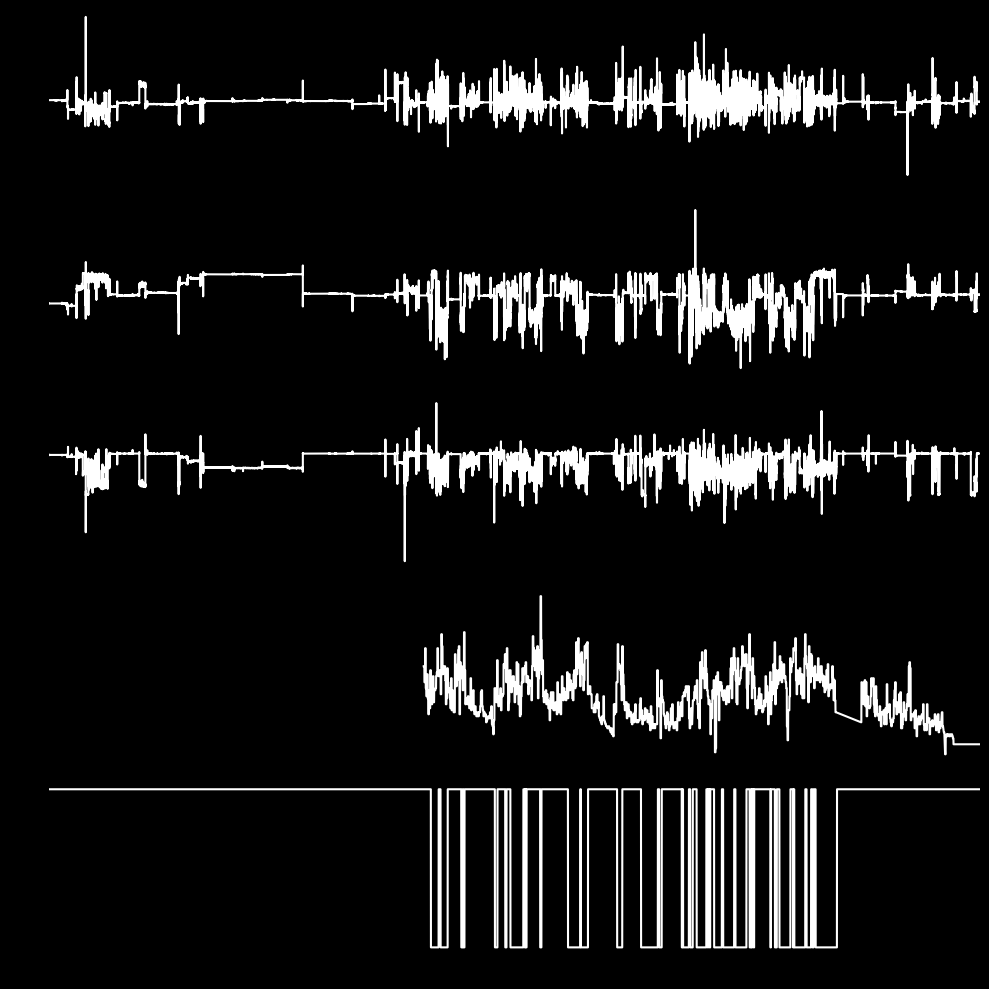

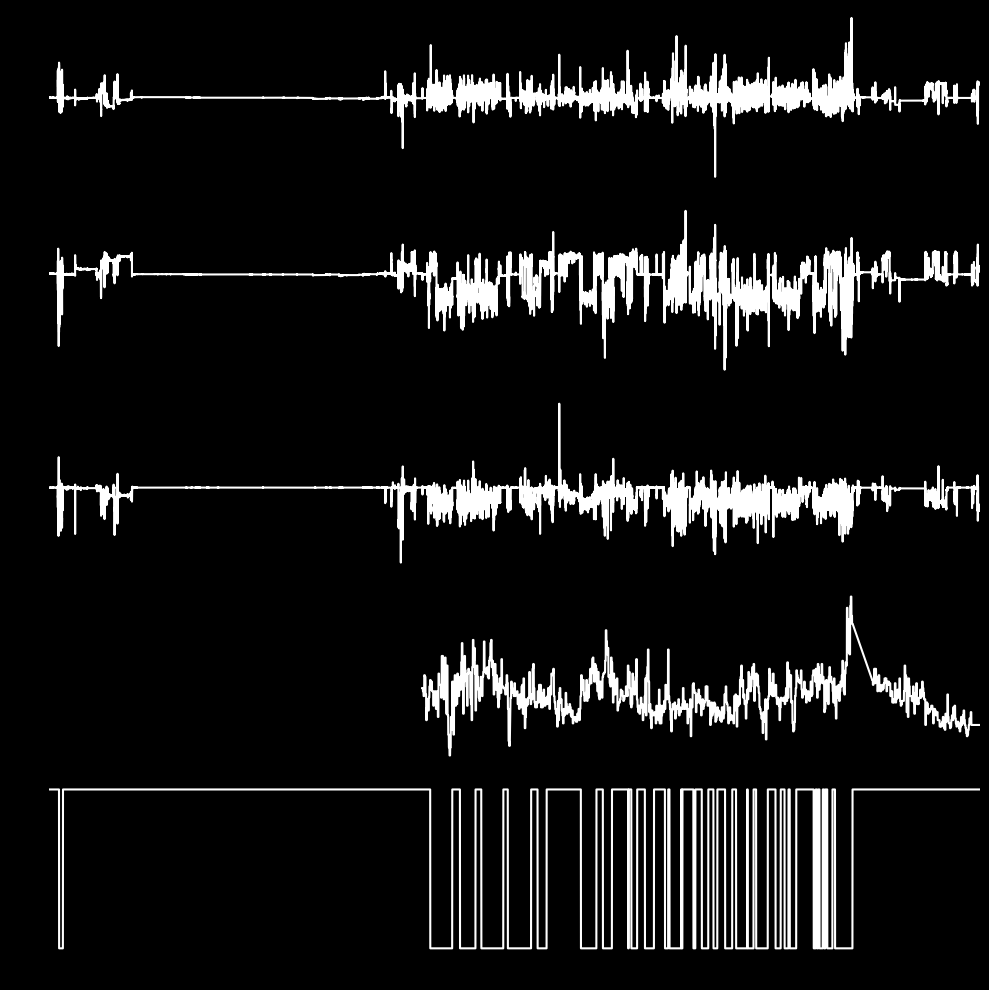

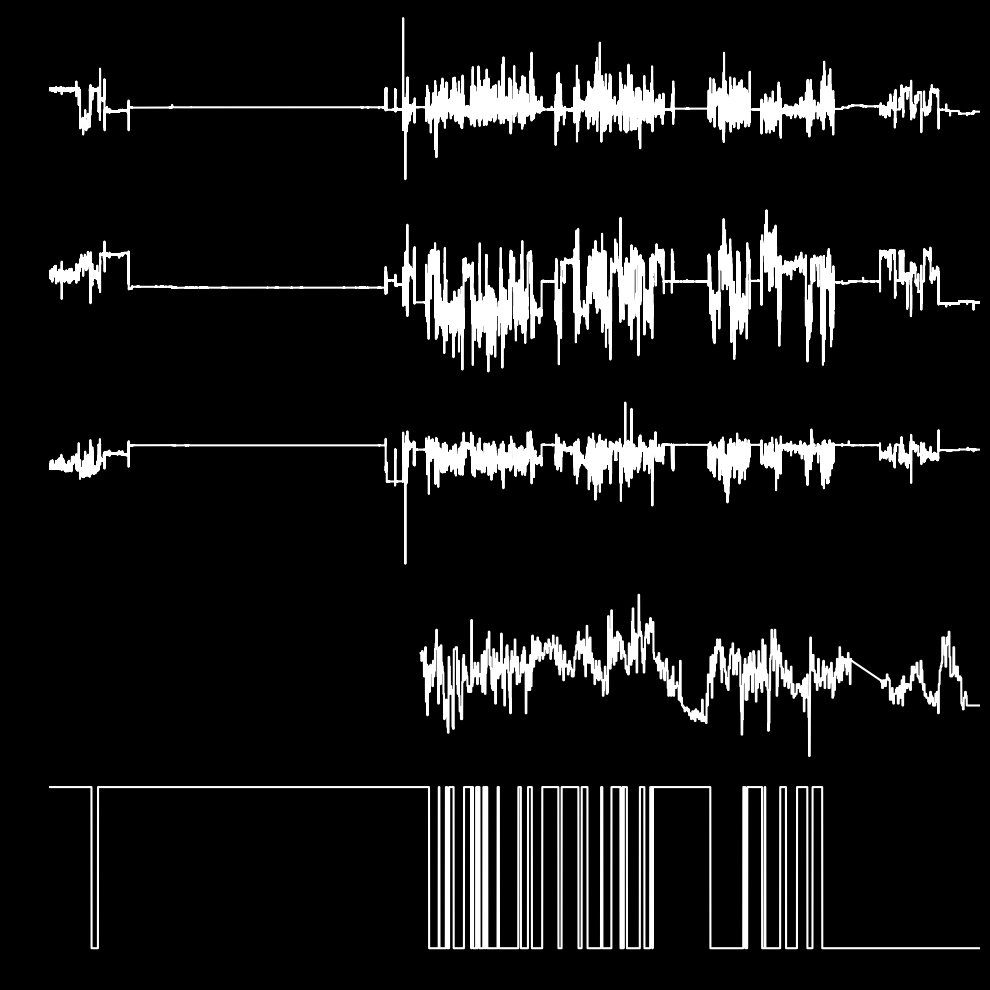

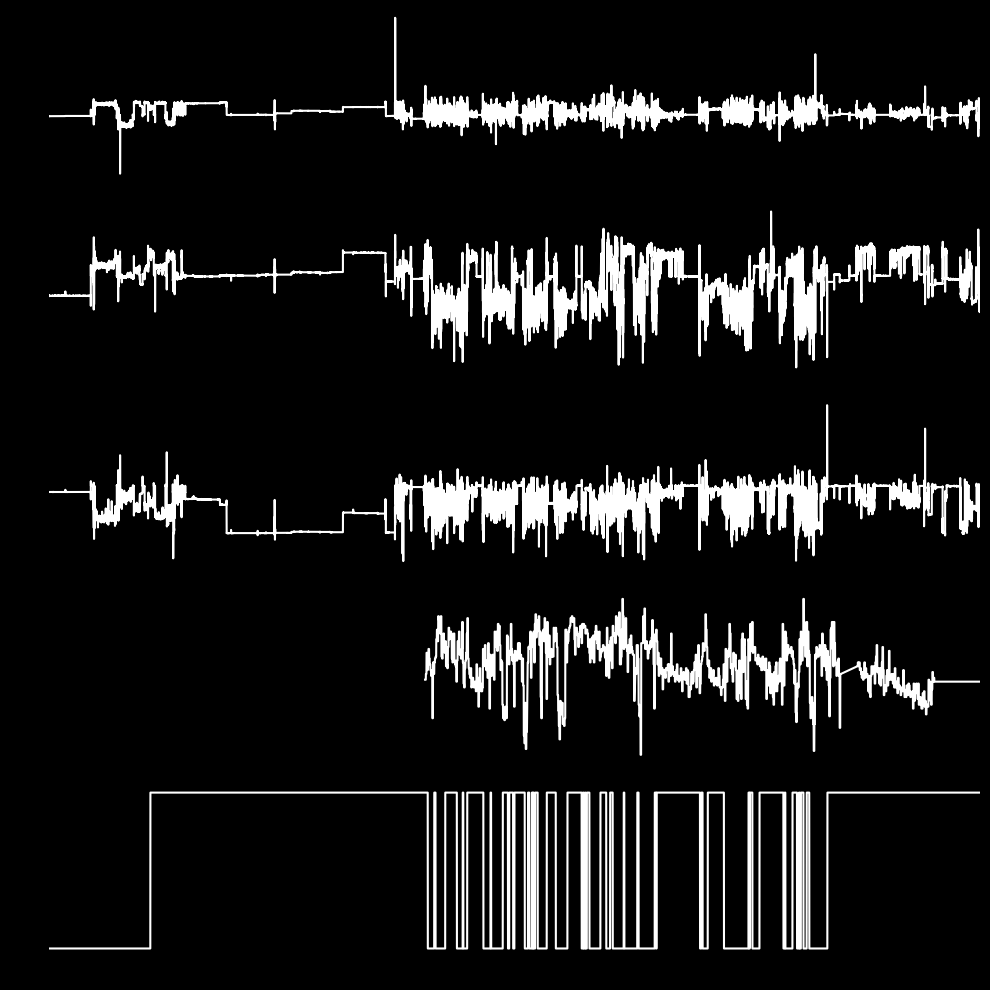

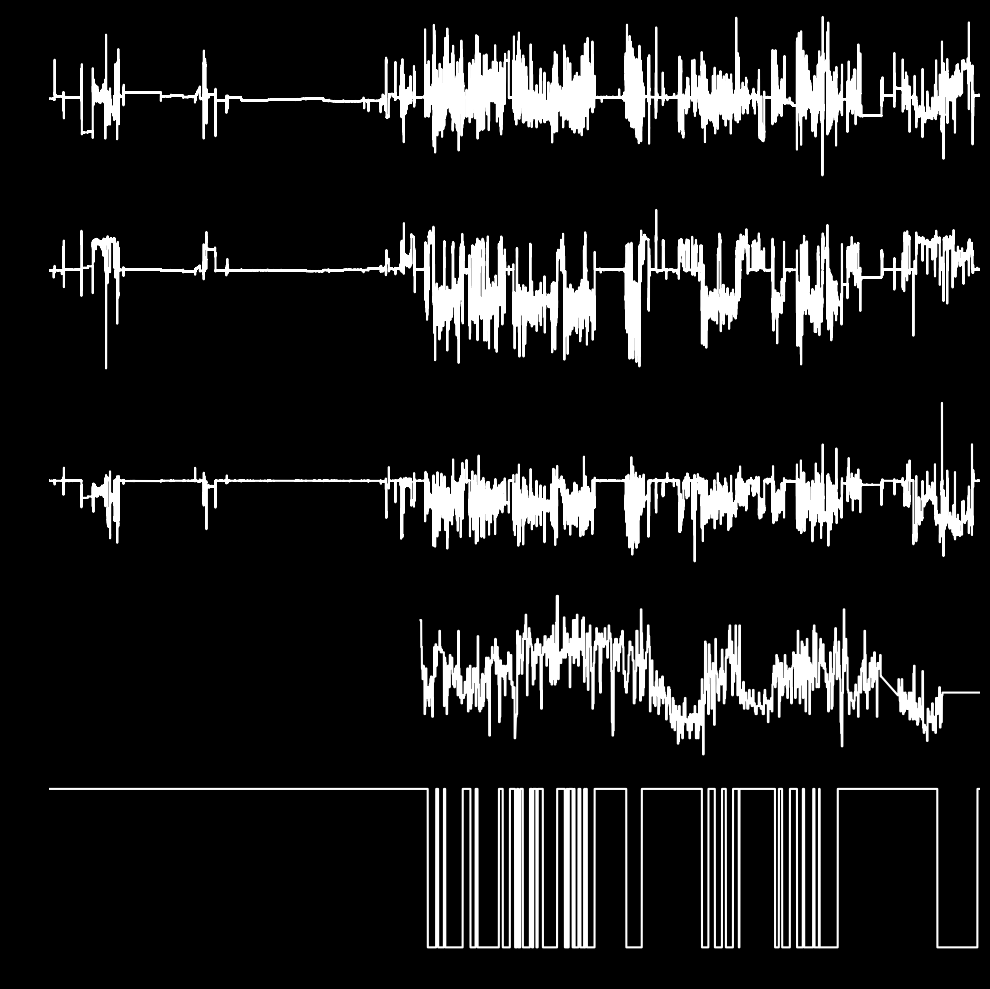

...

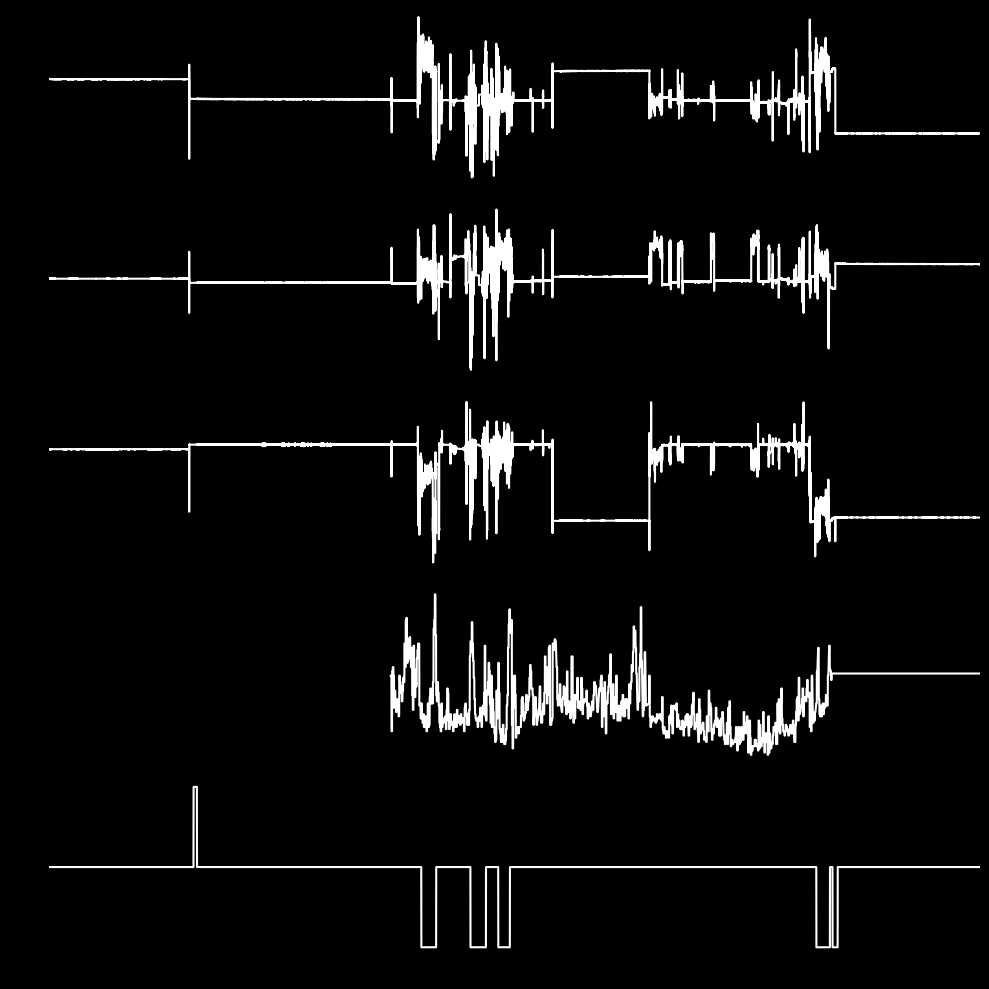

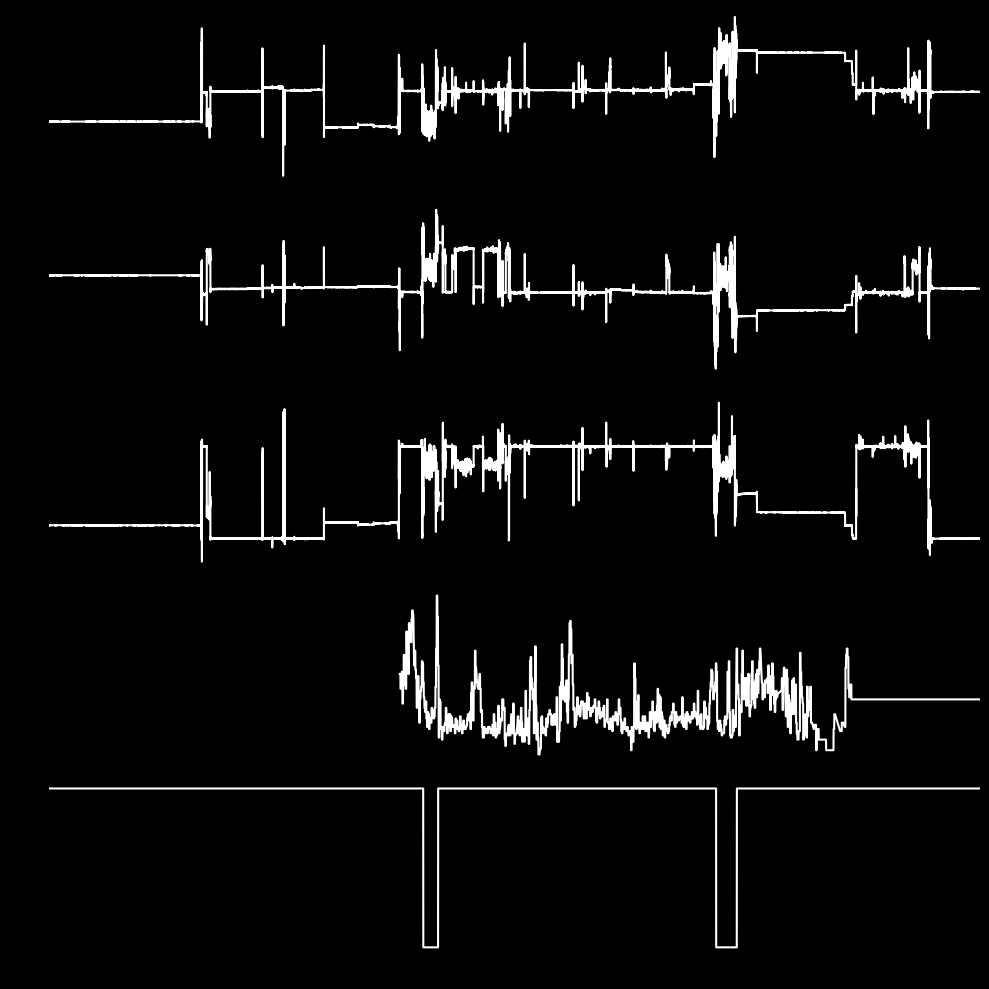

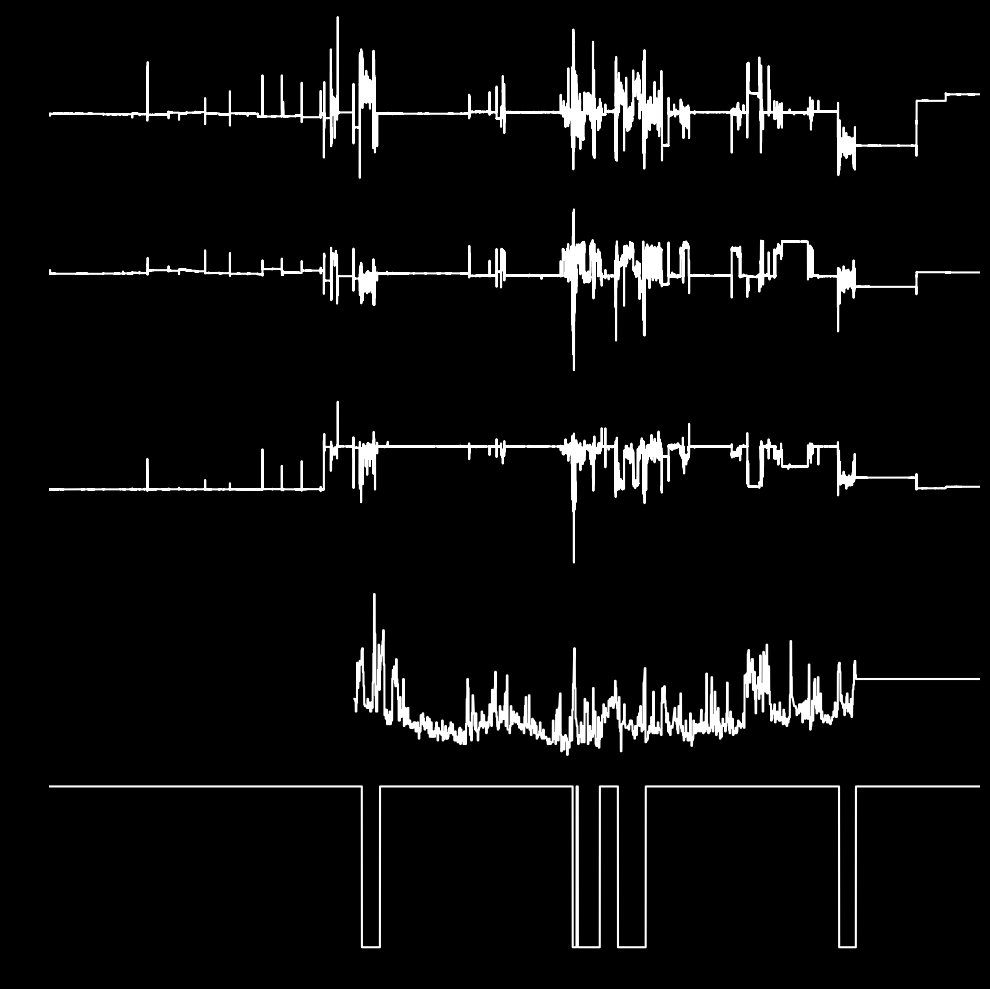

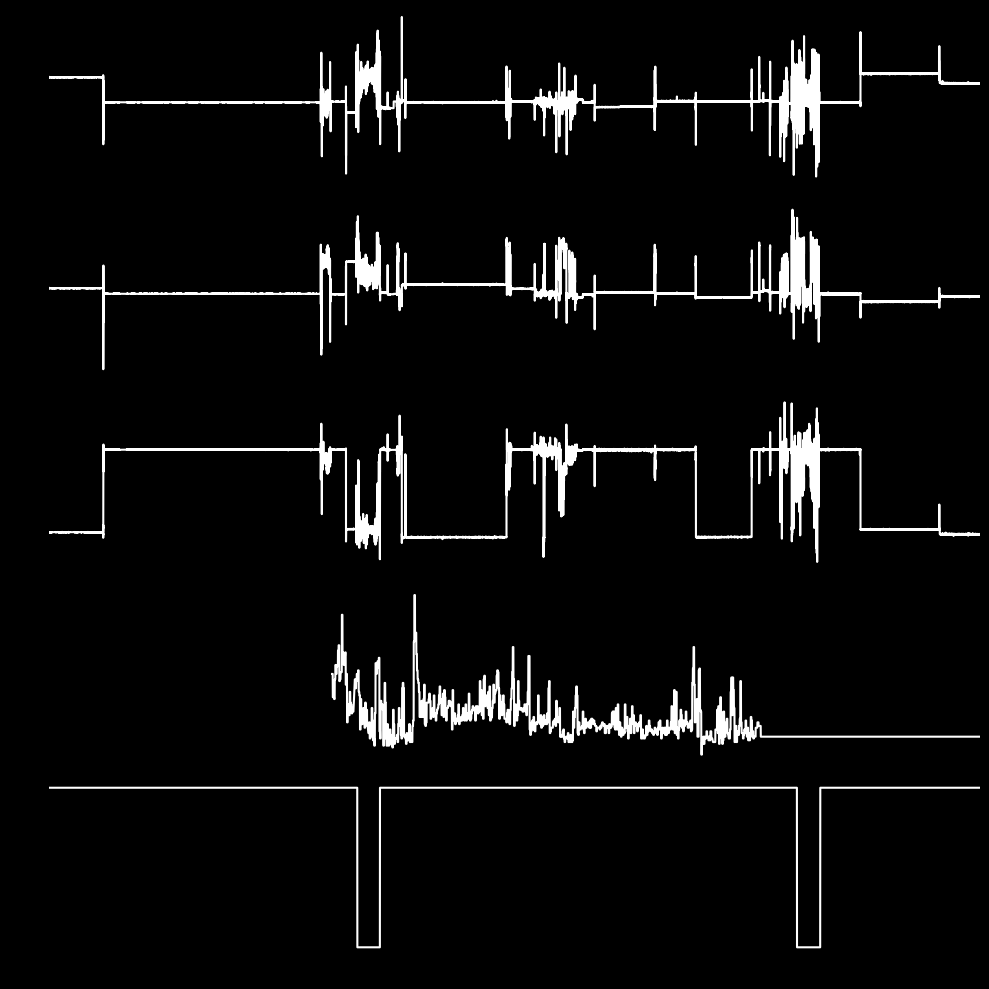

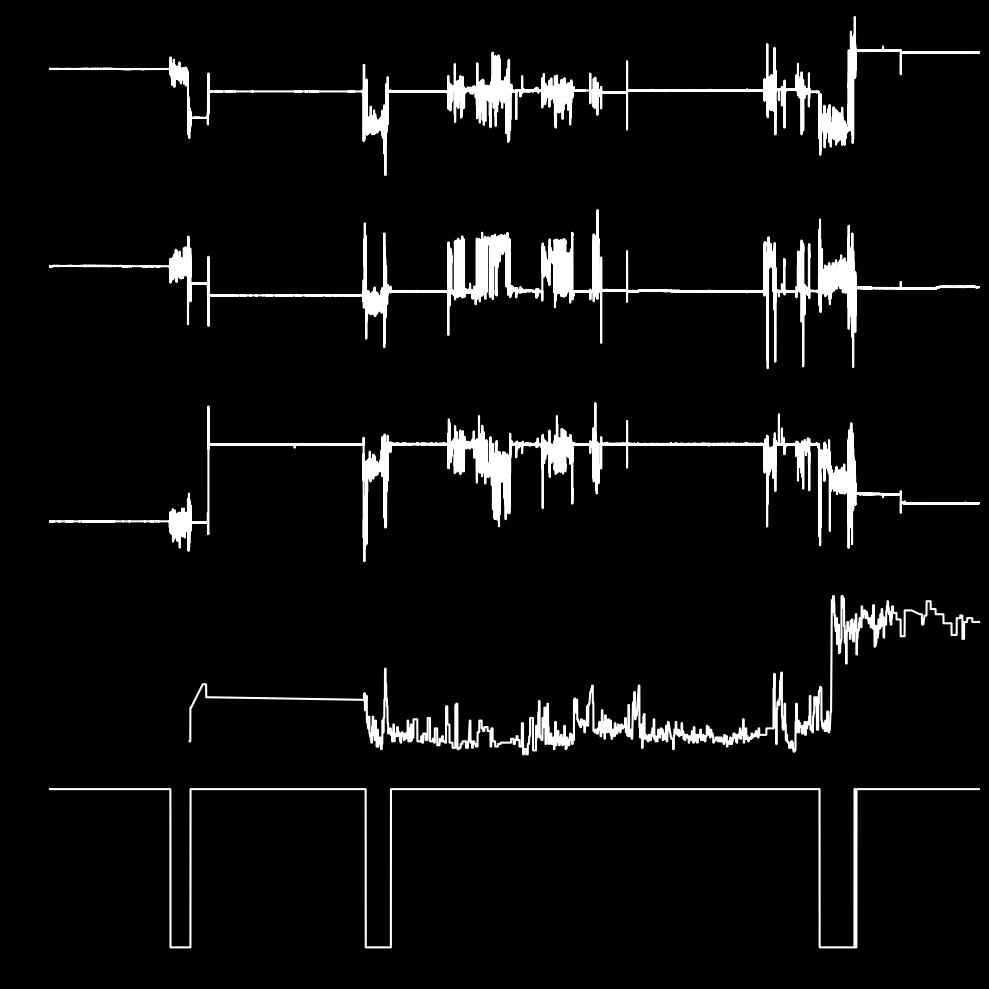

In [135]:
from tqdm.auto import tqdm

bar = tqdm(range(val_df.shape[0]))

for idx in bar:
    user, date, *rest = val_df.iloc[idx].values

    bar.set_description(f'user: {user}, date: {date}')
    # 1-1
    merged_data= merge_data_for_group(user, date)
#     2-1
    plot_time_series(merged_data, user, date)
    
#     break

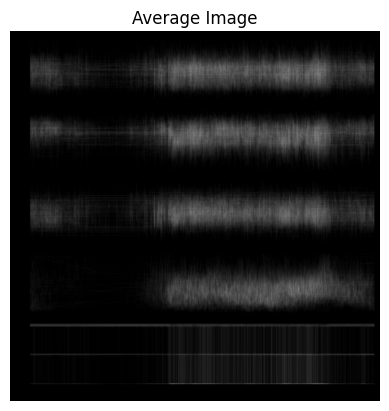

In [138]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# 이미지 디렉터리 경로
image_dir = '../new_image_dataset'

# 이미지 파일 목록 가져오기
image_files = [f for f in os.listdir(image_dir) if f.endswith('valid.png')]

# 첫 번째 이미지로 기준 크기 설정
first_image_path = os.path.join(image_dir, image_files[0])
first_image = Image.open(first_image_path)
image_size = first_image.size

# 이미지 불러오기 및 배열로 변환
images = []
for file in image_files:
    image_path = os.path.join(image_dir, file)
    image = Image.open(image_path).resize(image_size)
    images.append(np.array(image))

# 평균 이미지 계산
average_image = np.mean(images, axis=0).astype(np.uint8)

# 평균 이미지 시각화
plt.imshow(average_image)
plt.axis('off')
plt.title('Average Image')
plt.show()
